In [1]:
from Datagen import train_test
import os
from ImageDataset import train_test_split
import numpy as np
from pathlib import Path
from torch.utils.data import Dataset
import imageio
from ImageDataset import FolderImageDataset
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from matplotlib import pyplot as plt
%matplotlib inline

In [35]:
path = Path("img5_stripes/2/")

paths = [
    Path("img5_stripes/2/"),
    Path("img5_stripes/3/"),
      Path("img4_stripes/")
]

In [36]:
def condition(a):
    # based on dataset inspection plots
    return ((0.112 > a) & (a > 0.105))

In [ ]:
net = torch.nn.Sequential(
        torch.nn.Linear(150, 200),
        torch.nn.LeakyReLU(),
        torch.nn.Linear(200, 100),
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 1),
    )

In [99]:
class Net_pcas(nn.Module):
    def __init__(self, N):
        super(Net_pcas, self).__init__()
        self.linear1 = nn.Linear(N,int(2*N))
        self.linear2 = nn.Linear(int(2*N), int(N/4))
        self.linear3 = nn.Linear(int(N/4), 1)
        self.bn1 = nn.BatchNorm1d(int(N/2))
    def forward(self, x):
        y1 = F.sigmoid(self.linear1(x))
        #y1 = self.bn1(y1)
        y1 = F.sigmoid(self.linear2(y1))
        y1 = self.linear3(y1)
        
      
        return y1
    
    
def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.mse_loss(output, target)
        loss.backward()
        optimizer.step()
        train_loss = loss.item()
#         if batch_idx % 10 == 0:
#             print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}\t mse: {}'.format(
#                 epoch, batch_idx * len(data), len(train_loader.dataset),
#                 100. * batch_idx / len(train_loader), train_loss, target.std()**2))
    return train_loss

def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0.
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.mse_loss(output, target, reduction='sum').item() # sum up batch loss

    test_loss /= len(test_loader.dataset)

#     print('\nTest set: Average loss: {:.7f}\n'.format(
#         test_loss))
    return test_loss

In [108]:
BATCH=1
N_COMPONENTS = 50
train_test_sp = train_test(paths, N_COMPONENTS, filtered = condition)
train_dataset, test_dataset = train_test_sp.get()
pcas = train_dataset.pcas



In [93]:
def get_part(dataset, k):
    target = dataset.target
    target = set(target)
    target = list(target)

    target = target[::k]
      
    new_target = []
    new_images = []
    for i, item in enumerate(dataset.target):
        if item in target:
            new_target.append(item)
            new_images.append(dataset.images[i])
    
    dataset.target = np.array(new_target)
    dataset.images = np.array(new_images)
    return dataset

In [94]:
train_dataset = get_part(train_dataset, 7)

In [109]:
train_loader = torch.utils.data.DataLoader(
        train_dataset,
     batch_size=BATCH, shuffle=True)
test_loader = torch.utils.data.DataLoader(
        test_dataset,
batch_size=BATCH, shuffle=True)



/Users/maxim/anaconda3/lib/python3.7/site-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


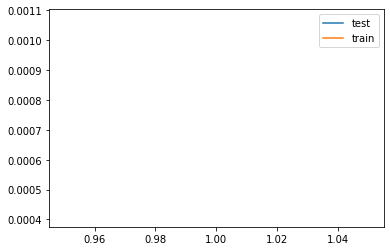

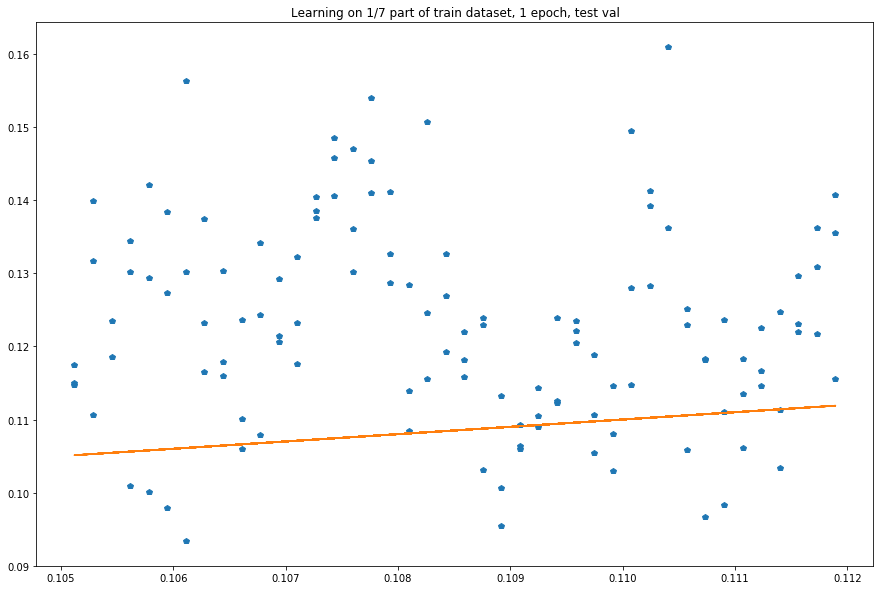

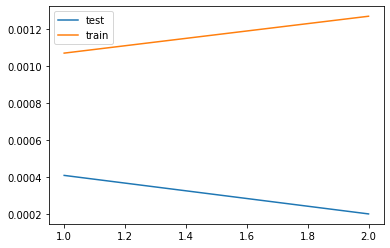

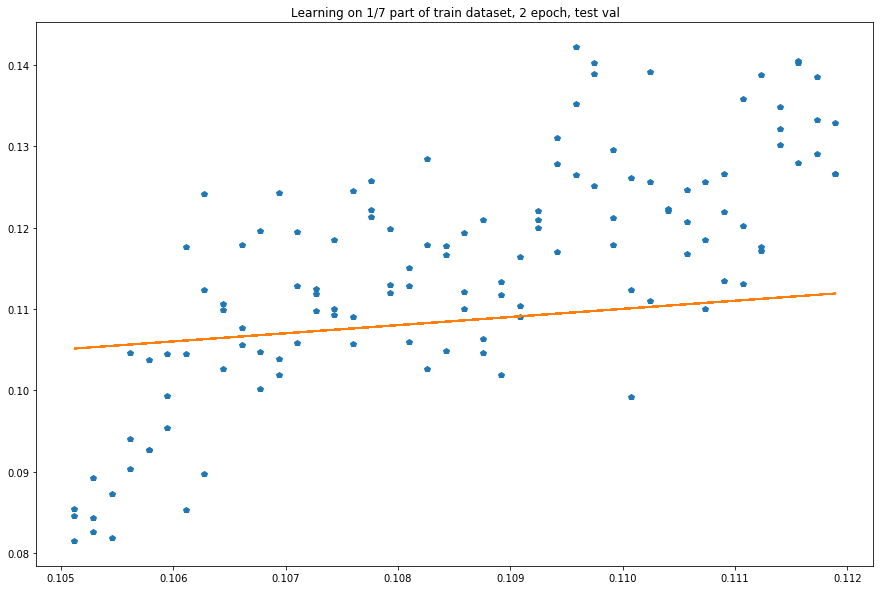

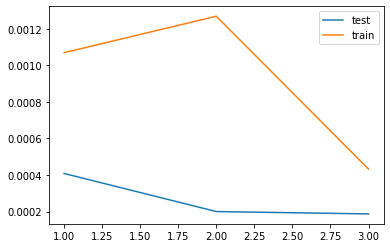

...

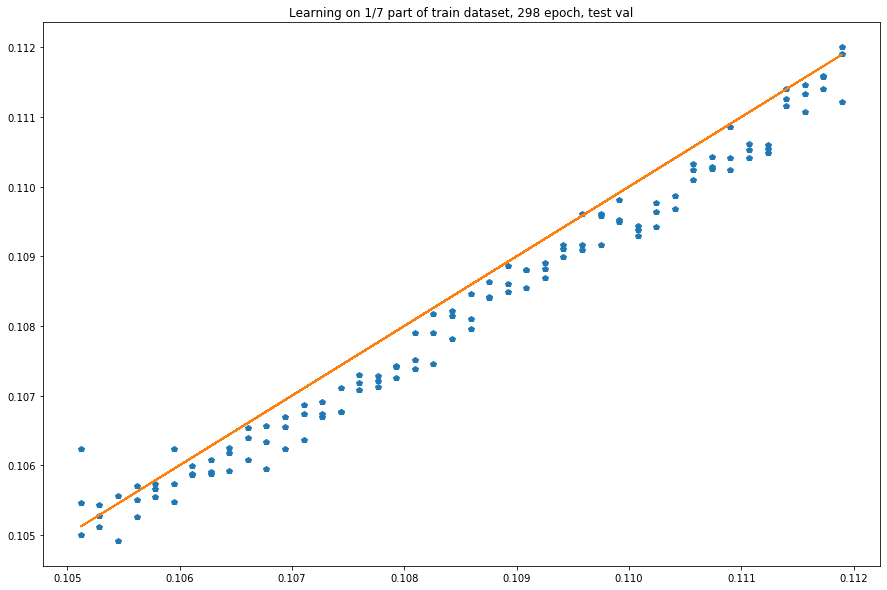

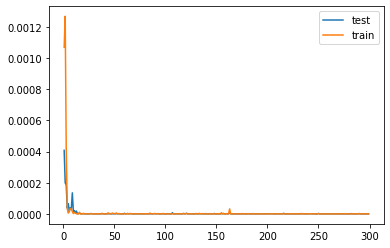

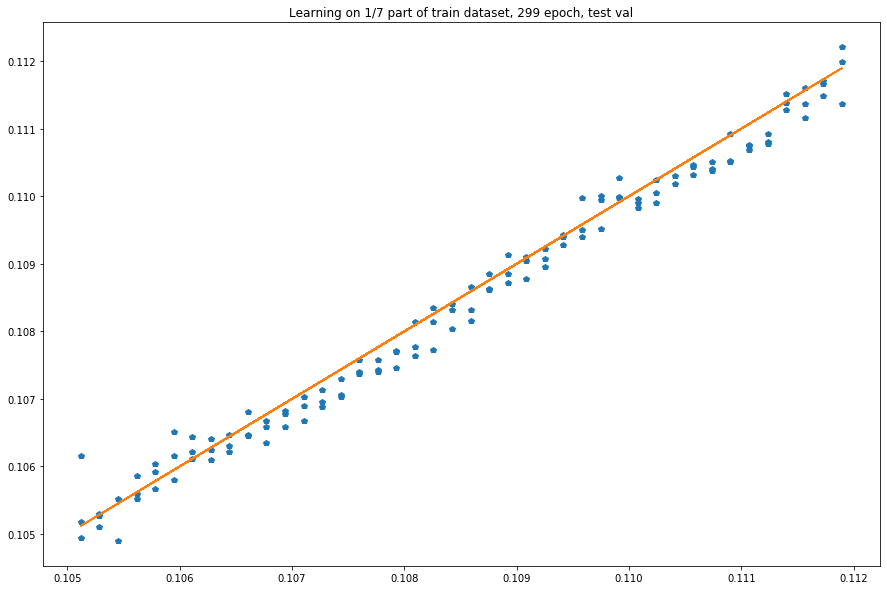

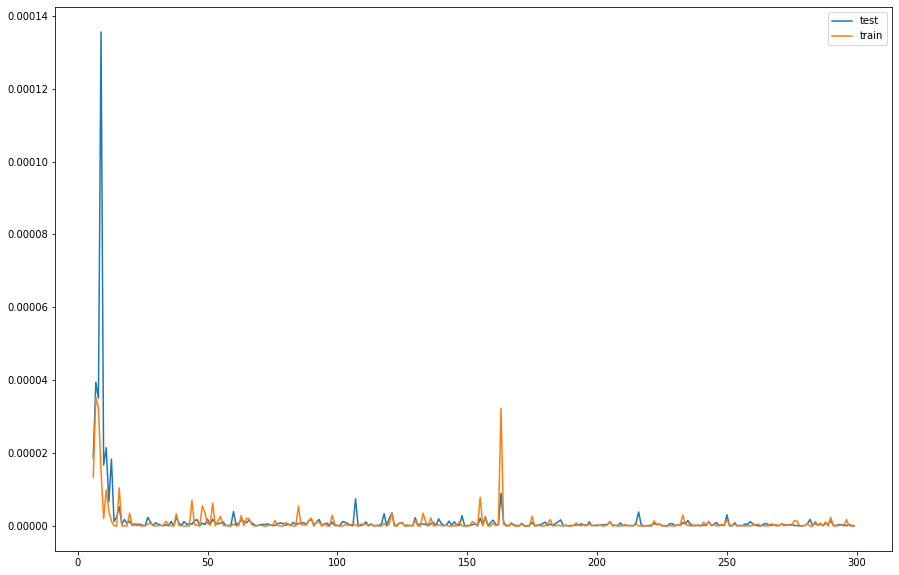

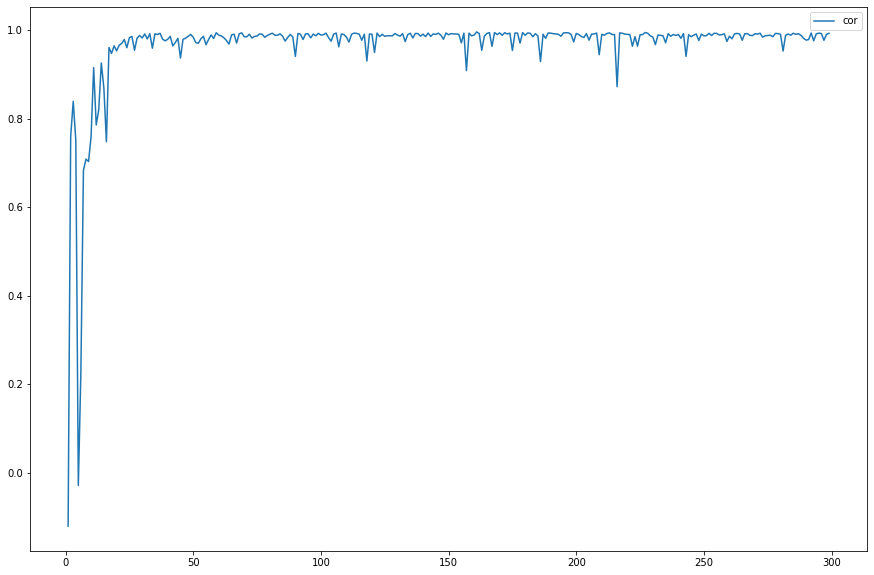

In [110]:
model = Net_pcas(N_COMPONENTS*len(paths))
use_cuda = False
device = torch.device("cuda" if use_cuda else "cpu")
optimizer = optim.Adam(model.parameters(), lr=1e-3)


epochs = []
test_loss = []
train_loss = []
cor = []
for epoch in range(1,300):
    los  = train( model, device, train_loader, optimizer, epoch)
    
    train_loss.append(los)
    
    los = test( model, device, test_loader)
    test_loss.append(los)
    epochs.append(epoch)
    plt.plot(epochs, test_loss, label = "test")
    plt.plot(epochs, train_loss, label = "train")
    plt.legend()
    plt.show()

    if True:
        y_np = np.array([])
        pred_np = np.array([])
        for x,y in test_loader:
            pred = model(x)
            pred_np = np.concatenate((pred_np,np.array(pred.reshape(-1).detach())))
            y_np =  np.concatenate((y_np, np.array(y).flatten()))
        fig = plt.figure(figsize = (15, 10))
        plt.plot(y_np, pred_np, 'p')
        plt.plot(y_np, y_np)
        plt.title("Learning on 1/7 part of train dataset, {} epoch, test val".format(epoch))
#         fig.savefig(path_to_save+"{}".format(BATCH)+"/pred_real/"+"{}".format(epoch)+'.png')
        plt.show()
        cor.append(np.corrcoef(y_np, pred_np)[0][1])

        
        
fig = plt.figure(figsize = (15, 10))   
plt.plot(epochs[5:], test_loss[5:], label = "test")
plt.plot(epochs[5:], train_loss[5:], label = "train")
plt.legend()
# fig.savefig(path_to_save+"{}".format(BATCH)+"/mse/"+"loss"+'.png')
plt.show()

fig = plt.figure(figsize = (15, 10))   
plt.plot(epochs, cor, label = "cor")
plt.legend()
# fig.savefig(path_to_save+"{}".format(BATCH)+"/cor_coeff/"+"cor"+'.png')
plt.show()

In [114]:

from Datagen import FolderImageDataset
# model = get_model(N_COMPONENTS, BATCH)


train_test_sp = train_test(paths, N_COMPONENTS)
names = train_test_sp.names
dataset = FolderImageDataset(paths, names = names, pca = pcas, N_COMPONENTS = N_COMPONENTS)
loader = torch.utils.data.DataLoader(
    dataset,
 batch_size=BATCH, shuffle=True)


y_np = np.array([])
pred_np = np.array([])
for x,y in loader:
    print(1)
    pred = model(x)
    pred_np = np.concatenate((pred_np,np.array(pred.reshape(-1).detach())))
    y_np =  np.concatenate((y_np, np.array(y).flatten()))
fig = plt.figure(figsize = (15, 10))
plt.plot(y_np, pred_np, 'p')
plt.plot(y_np, y_np)
plt.title("Extrapolation test on new net")
# fig.savefig(path_to_save+"{}".format(BATCH)+"/pred_real/"+"{}".format(epoch)+'.png')
plt.show()

KeyboardInterrupt: 

# Classical fitting

In [5]:
from pathlib import Path
from fitting_data import gauss_est
from fitting_data import data_from_dataset
from fitting_data import dataset_from_folder
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
paths = [
    Path("img5_stripes/2/"),
    Path("img5_stripes/3/"),
      Path("img4_stripes/")
]

In [21]:
train_dataset, test_dataset = dataset_from_folder(paths).split(filtered = condition)

In [22]:
train_target = train_dataset[0]
train_inten = train_dataset[1]
test_target = test_dataset[0]
test_inten = test_dataset[1]

In [23]:
model = gauss_est(0.00005)

In [24]:
model.fit(train_target, train_inten)

In [25]:
X_predicted, proba_predicted, prob_result = model.predict(test_inten, probability = True)

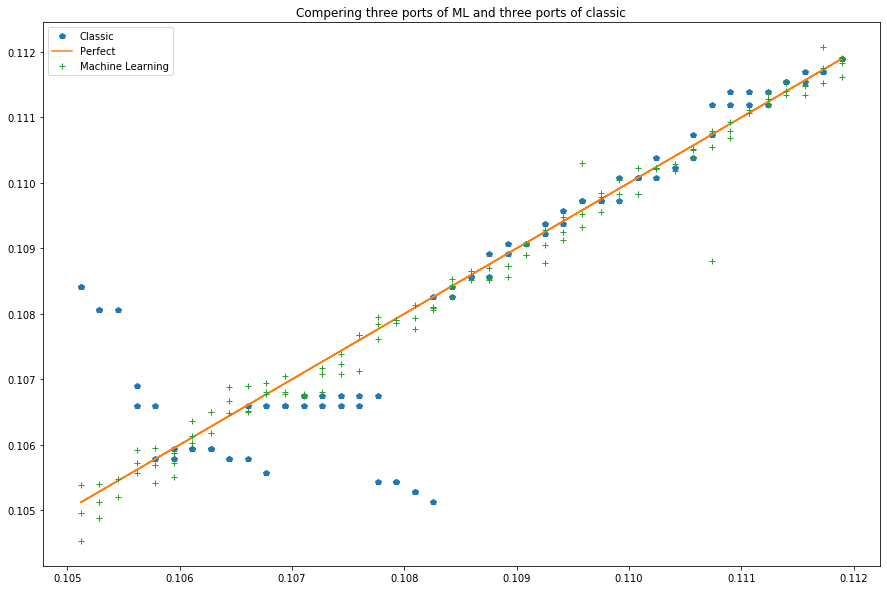

In [45]:
fig = plt.figure(figsize = (15, 10))
plt.plot(test_target, X_predicted, "p", label = "Classic")
plt.plot(test_target, test_target, label = "Perfect")
plt.plot(y_np, pred_np, '+', label = "Machine Learning") 
plt.title("Compering three ports of ML and three ports of classic")
plt.legend()